#Dinámica Molecular - Informe

##Introducción:

The Art of Molecular Dynamics Simulation de Rapapor es un libro acerca de dinámica molecular. De este libro on-line se usó el código en el que se simula un gas que interactua de acuerdo al potencial de Leonnard Jones. La distribucción molecular de este gas se modela de forma similar a la distribucción de Rayleigh. A continuación se muestra los histogramas de posiciones en X y en Y, los histogramas de las posiciones en X y Y, con sus respectivas animaciones. El objetivo principal de este informe es comprobar que esta simulación del gas se ajusta a la distribución de Rayleigh.

La distribución de Rayleigh es una derivada de la distribucción exponencial.

Su función de densidad esta dada por:

$
f(x)=\frac{x e^{\frac{-x^{2}}{2\sigma^{2}}}}{\sigma ^{2}}
$

Siendo la función de distribución:

$
f(x)=1-e^{\frac{-x^{2}}{2\sigma^{2}}} 
$

In [7]:
#Importar todas las librerias necesarias para poder producir el experimento 1
%pylab inline
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from scipy.optimize import curve_fit
from matplotlib import animation
import pandas as pd
archivo=np.genfromtxt("./Rayleigh.csv", delimiter=",")

Populating the interactive namespace from numpy and matplotlib


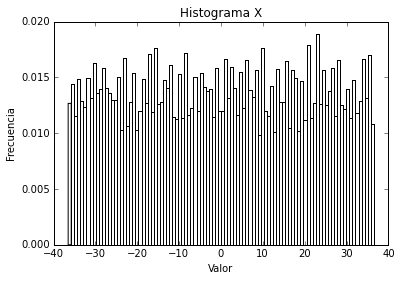

In [8]:
#En el archivo excel, la primera columna es la posición en X, donde muestro el histograma de la misma
numerosA = archivo[:,0]
plt.hist(numerosA, normed=True, bins=100, color='w')
plt.title("Histograma X")
plt.xlabel("Valor")
plt.ylabel("Frecuencia")
plt.show()

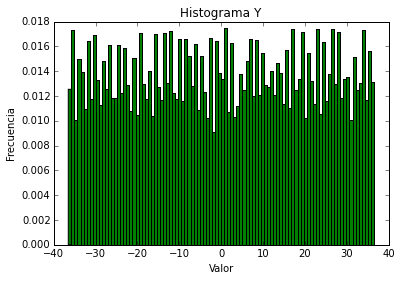

In [9]:
#En la segunda columna del archivo de excel se encuentra la posición en Y, a continuación muestro el histograma correpondiente
numerosB = archivo[:,1]
plt.hist(numerosB, normed=True, bins=100, color='g')
plt.title("Histograma Y")
plt.xlabel("Valor")
plt.ylabel("Frecuencia")
plt.show()

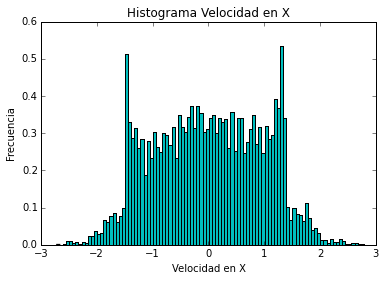

In [10]:
#De la columan tres de nuestro archivo de excel corresponde a la Velocidad en X, de igual forma muestro el histograma
numeros1 = archivo[:,2]
plt.hist(numeros1,normed=True, bins=100, color='c')
plt.title("Histograma Velocidad en X")
plt.xlabel("Velocidad en X")
plt.ylabel("Frecuencia")
plt.show()

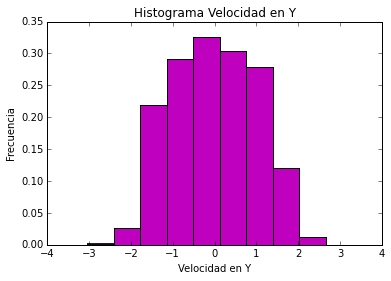

In [11]:
#Del archivo de excel la columna 4, muestra la velocidad en Y, de igual forma muestro el histograma
numeros2 = archivo[:,3]
plt.hist(numeros2, normed=True, bins=10,color='m')
plt.title("Histograma Velocidad en Y")
plt.xlabel("Velocidad en Y")
plt.ylabel("Frecuencia")
plt.show()

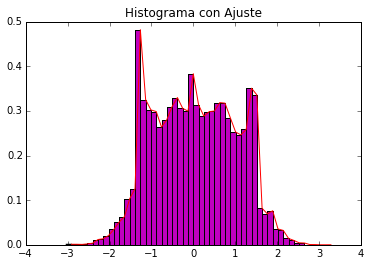

In [96]:
#Para realizar un ajuste lineal de los histogramas, necesito extraer la información de frecuencia del histograma.
y,x,info = plt.hist(numeros2, normed=True, bins=50, color='m')
line=plt.plot(x[1:],y, color ='r')
plt.title("Histograma con Ajuste")
plt.show()

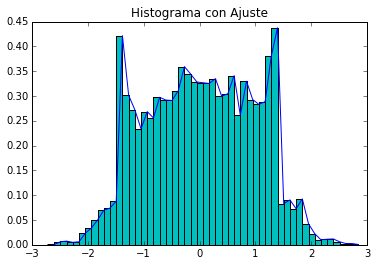

In [95]:
#De igual manera, para realizar el ajuste para la velocidad en X debo extraer información del histograma
y, x, info = plt.hist(numeros1,normed=True, bins=50, color='c')
lineal=plt.plot(x[1:],y, color='b')
plt.title("Histograma con Ajuste")
plt.show()

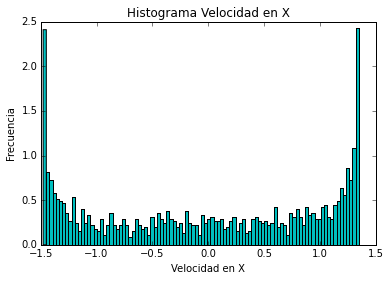

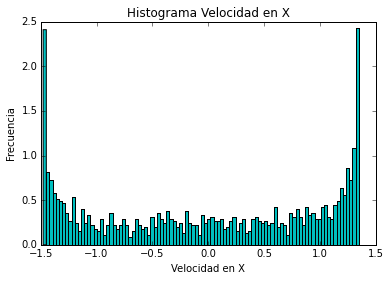

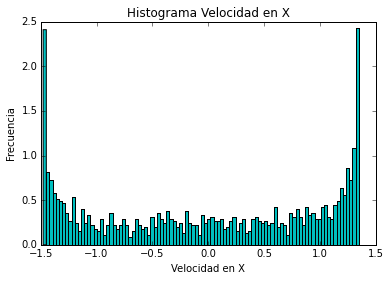

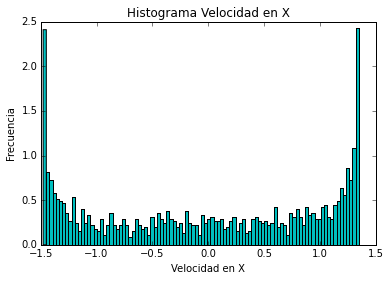

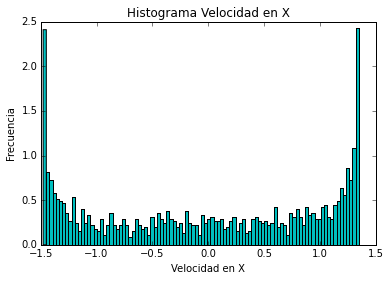

...

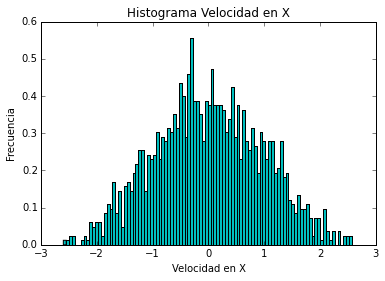

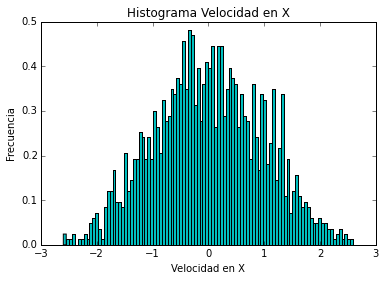

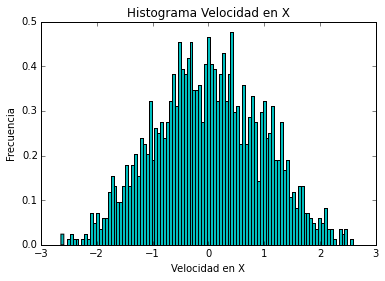

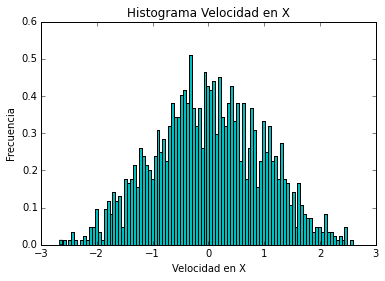

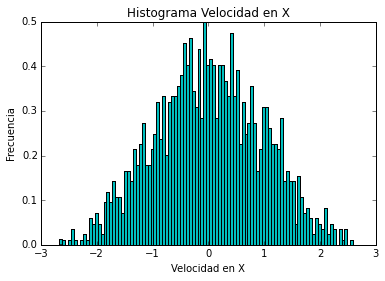

In [35]:
#Existen varias formas de realizar la animación, para este caso usamos un for para generar las 251 imagenes y luego con un comando en Bash se produjo el gif completo
#Otra forma de realizar la animación es con la función de animation, pero no funciono porque no se tienen todos los drivers para correr la animación
def iteracion():
#    plt.cla()
    for i in range (0,251): 
        plt.hist(numeros1[(i)*1600:(i+1)*1600], normed=True, bins=100, color='c')
        plt.title("Histograma Velocidad en X")
        plt.xlabel("Velocidad en X")
        plt.ylabel("Frecuencia")
        #y, x, info = plt.hist(numeros1,normed=True, bins=100, color='c')
        #lineal=plt.plot(x[1:],y, color='b')
        #plt.ylim(0,1)
        n=str(i)
        plt.savefig(n)
        plt.show()
iteracion()
        
#fig = plt.figure(figsize=(5,4))    
#anim = animation.FuncAnimation(fig, animate, frames=251)
#anim.save('demoanimation.gif', writer='imagemagick', fps=4);

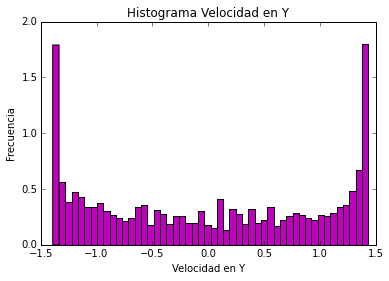

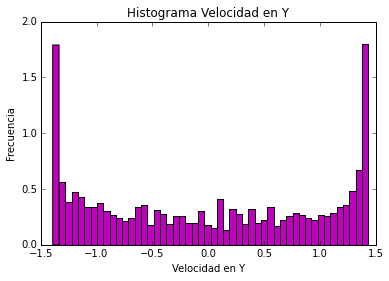

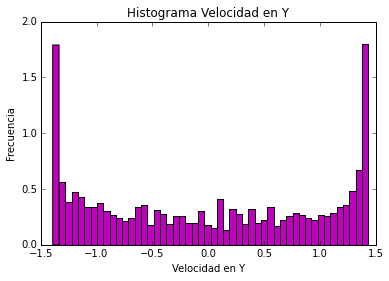

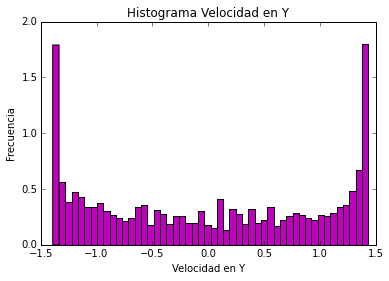

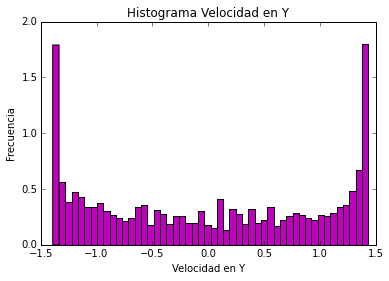

...

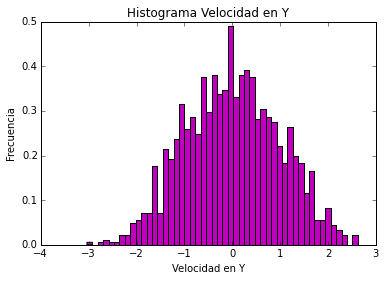

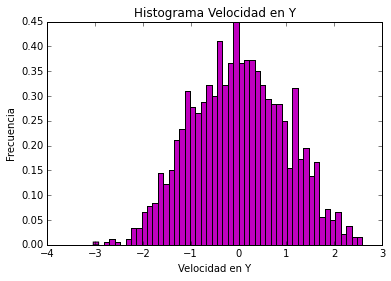

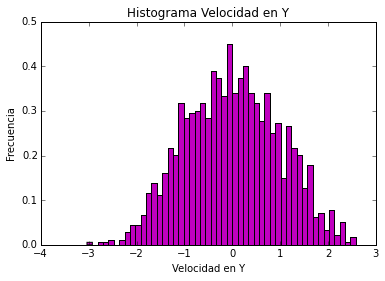

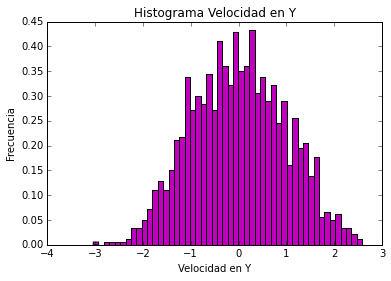

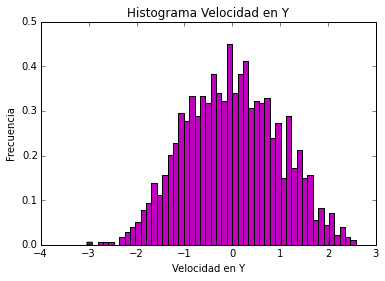

In [38]:
#Producir la animación de Velocidad en Y de la misma forma que el anterior bloque de código
def iteracion2():
    #plt.cla()
    for i in range(0,251):
        plt.hist(numeros2[i*1600:(i+1)*1600], normed=True, bins=50, color='m')
        plt.title("Histograma Velocidad en Y")
        plt.xlabel("Velocidad en Y")
        plt.ylabel("Frecuencia")
        #plt.show()
        #plt.ylim(0,1)
        #y,x,info = plt.hist(numeros2, normed=True, bins=50, color='m')
        #line=plt.plot(x[1:],y, color ='r')
        n=str(i)
        plt.savefig(n)
        plt.show()
        
iteracion2()
#fig = plt.figure(figsize=(5,4))    
#anim = animation.FuncAnimation(fig, animate, frames=251)
#anim.save('demoanimationY.gif', writer='imagemagick', fps=4);

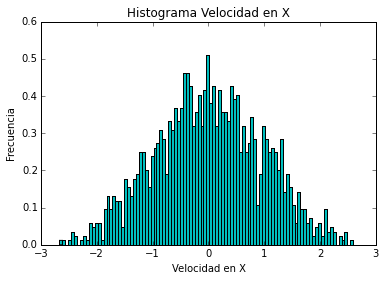

In [64]:
#Gráfica de la velocidad en X de los últimos 1600 datos. Última gráfica de la animación.
numeros1 = archivo[:,2]
plt.hist(numeros1[-1600:],normed=True, bins=100, color='c')
plt.title("Histograma Velocidad en X")
plt.xlabel("Velocidad en X")
plt.ylabel("Frecuencia")
plt.show()

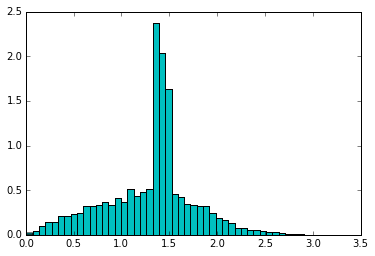

In [94]:
#Ajuste para la distribución de Rayleigh, creando el vector de rapidez, luego definiendo la distribución y luego el curve_fit correspondiente
vector=sqrt((numeros1**2)+(numeros2**2))
distribucion=hist(vector,normed=True, bins=50, color='c')
n=distribucion[0]
s=distribucion[1][0:50]
def ray(b,a):
    return b/a**2*(exp(-b**2/(2*a**2)))
#documentacion
fit=curve_fit(ray,s,n)

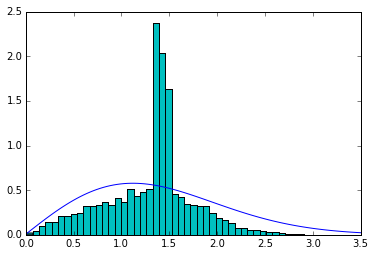

In [90]:
#Gráfica que muestra el ajuste de Rayleigh junto con el histograma de Rapidez
l=linspace(0,3.5,100)
a=fit[0]
plot(l,ray(b,a))
hist(vector,normed=True, bins=50, color='c')
plt.show()

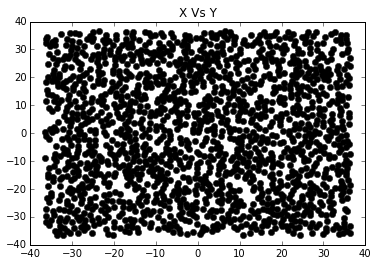

In [54]:
#Gráfica de la posiciones X vs Y 
figure()
plot(numerosA[-1:-1601:-1],numerosB[-1:-1601:-1],"o", color='k')
plt.title("X Vs Y")
show()

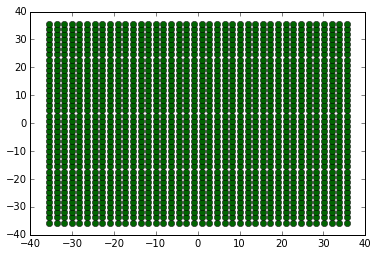

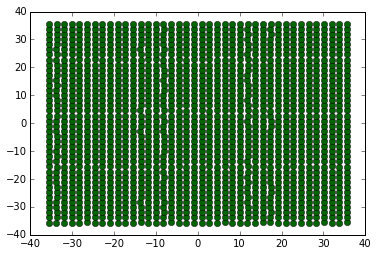

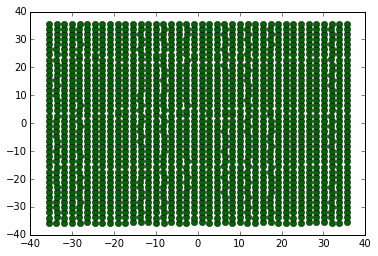

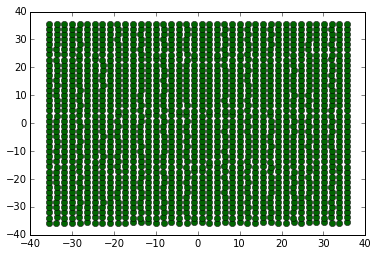

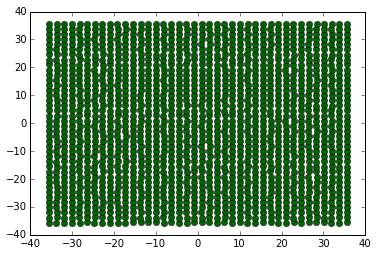

...

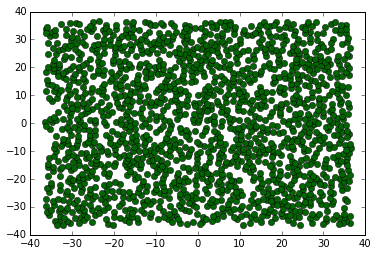

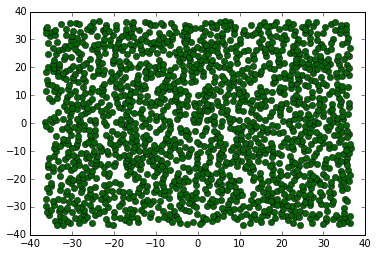

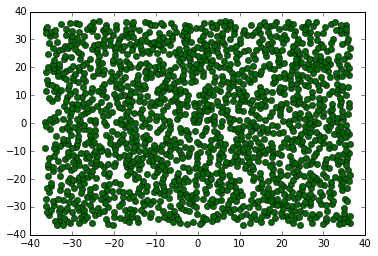

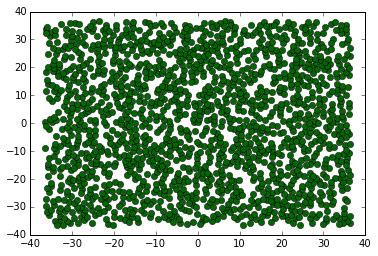

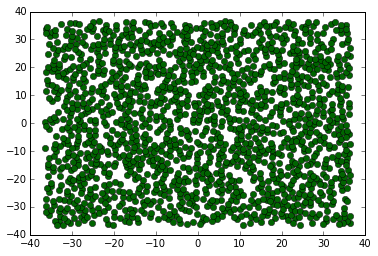

In [51]:
#Código de la animación para las posiciones, se creo de manera similar a la de los histogramas
def modelo():
    #plt.cla()
    for i in range(0,251):
        plt.plot(numerosA[i*1600:(i+1)*1600],numerosB[i*1600:(i+1)*1600],"o",color= 'darkgreen')
        n=str(i)
        plt.savefig(n)
        plt.show()

modelo()
#fig = plt.figure(figsize=(5,4))
#anim = animation.FuncAnimation(fig, animate2, frames=251)
#anim.save('demoanimation2.gif', writer='imagemagick', fps=4);

El anterior código es para realizar la animación de X Vs Y, en donde es posible ver la dinámica molecular 

#Conclusiones:

Según la función generatriz de momento de la distribución de Rayleigh, es posible conlcuir que si se ajusta correctamente a la distribución de velocidades del gas en cuestión.
Como bien sabemos la distribución de Rayleigh se presenta cuando un vector bidimensional (para este caso en particular el vector de rapidez de las velocidades X y Y) tiene sus componentes de forma  ortogonal, independientes y con una distribución normal.
De igual forma, la animación de las posiciones X y Y permite ver el cambio cada 1600 datos del gas.